In [6]:
import sys
import pathlib
pth=str(pathlib.Path().absolute())
sys.path.append(('\\').join(pth.split('\\')[:-1])+"\\Utils")
from Utilities import *

In [7]:
name='c1anemia-300'
di=('\\').join(pth.split('\\')[:-2])+'\\Data_base\\Imagenes_originales\\'+name+'.jpg'
ROI=('\\').join(pth.split('\\')[:-2])+'\\Data_base\\Sem_Auto\\eye_'+name+'.jpg'
img = io.imread(di)
ROI = io.imread(ROI)

In [8]:
f1=open(('\\').join(pth.split('\\')[:-2])+"\\Data_base\\validcrop.txt","r")
lines=f1.readlines()
linesn=np.array(lines)
linesn=np.delete(lines,np.where(linesn=="\n"))
linesn=linesn.reshape(-1,3)
linesnc=v_replace_err(linesn)
linesnc=np.vectorize(pyfunc=lambda x:np.array([x[0].split('\n')[0]]),signature="(n)->(m)")(linesnc.reshape(-1,1)).reshape(-1,3)
xywh=linesnc[:,:2]
imgnames=linesnc[:,2]
xywh=v_no_spaces(xywh)
xywh=np.vectorize(pyfunc=(lambda x:float(x)))(xywh.reshape(1,-1)[0])
xywh=xywh.reshape(-1,4).astype(int)+1

mr=xywh[np.where(imgnames==(name+".jpg"))][0]
mask=assemble_mask(mr,img,ROI)

In [9]:
lum = np.mean(mask,axis=2).astype(int)
mask1=lum>0
m_slic = slic(img, n_segments=20,sigma=5,mask=mask1)

In [10]:
RID=np.unique(m_slic.flatten())
f=np.zeros((img.shape[0],img.shape[1],3+3+3+1))
f[:,:,0:3]=img[:,:,0:3]
f[:,:,3:6]=color.rgb2hsv(img)[:,:,0:3]
f[:,:,6:9]=color.rgb2lab(img)[:,:,0:3]
f[:,:,9]=m_slic

In [11]:
def get_Hist_by_format(f,ind1,ind2,j):
    hist=np.vectorize(pyfunc=(lambda t:np.histogram(f[ind1,ind2,t],bins=1000,range=(0,255))),
                  signature='()->(j),(k)')(j)
    return hist[0],hist[1]
v_get_Hist_by_format=np.vectorize(pyfunc=get_Hist_by_format,signature='(x,y,z),(a),(b),(j)->(j,q),(j,w)')

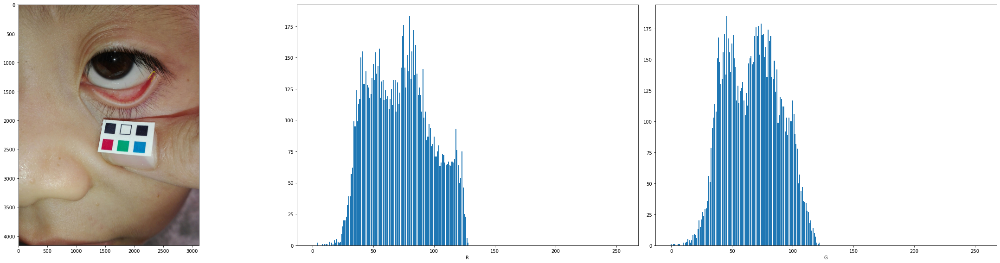

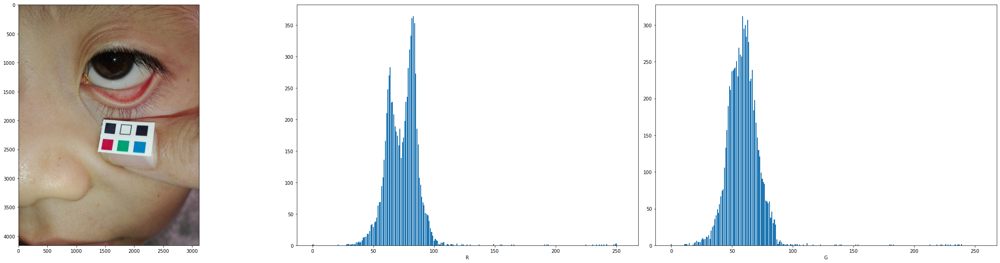

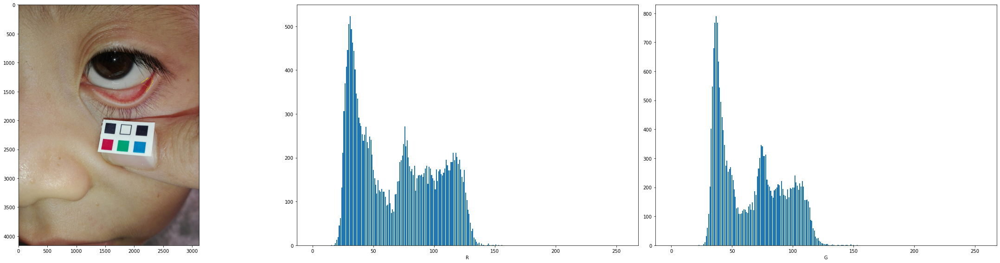

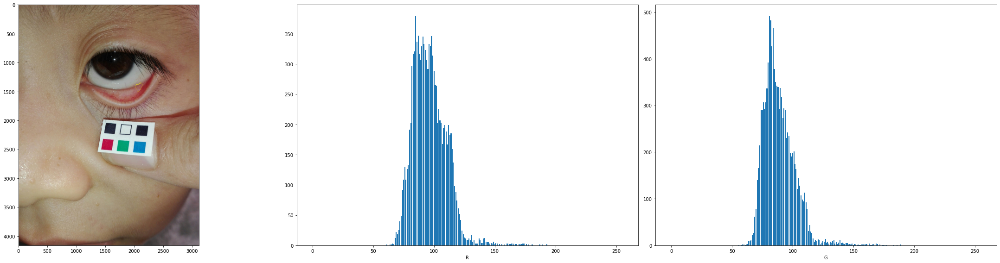

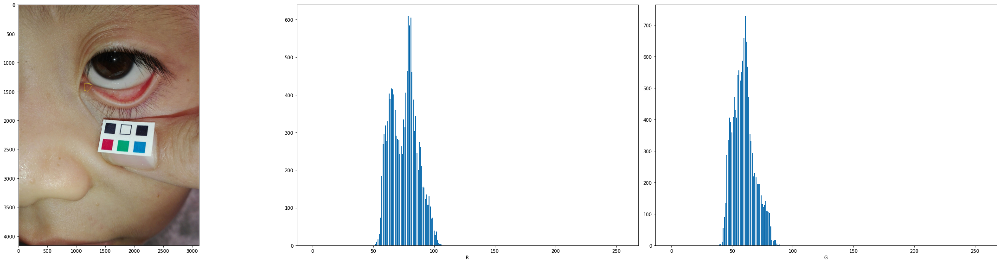

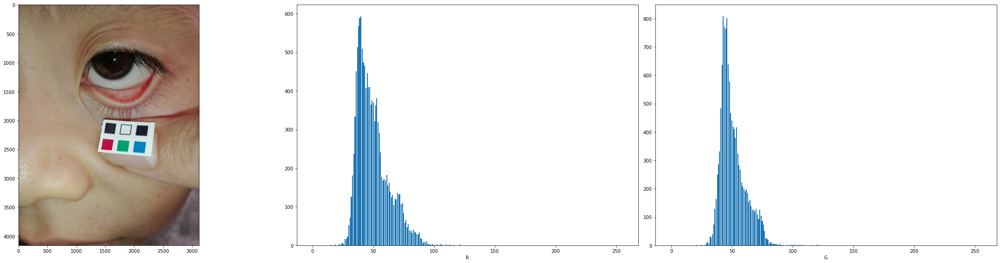

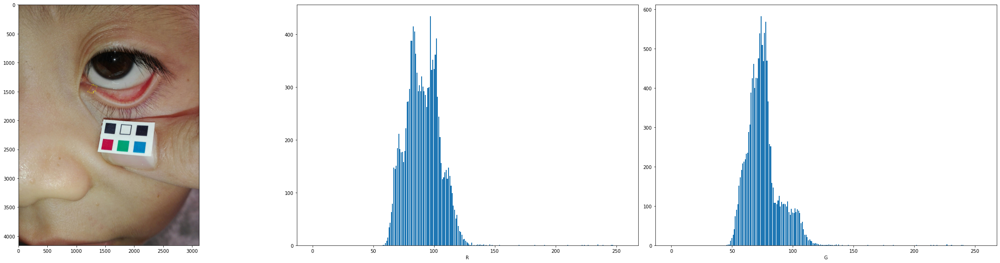

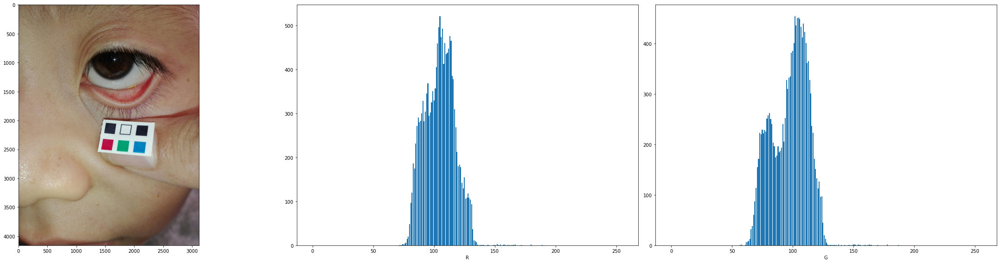

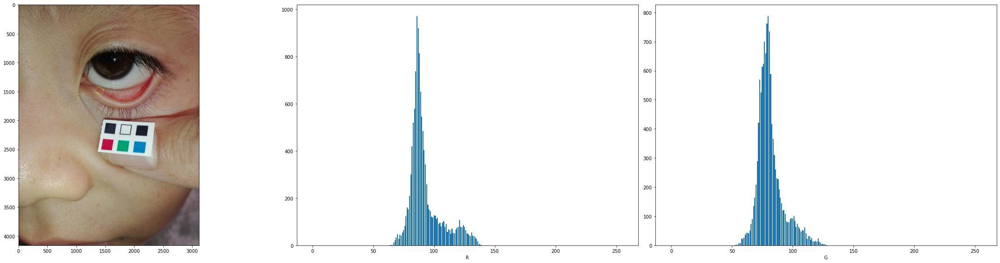

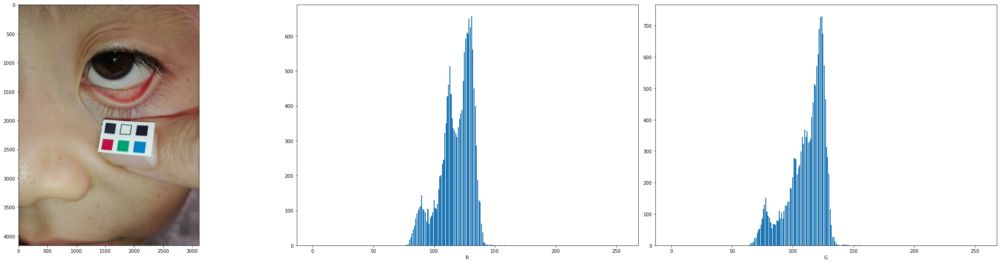

In [36]:
for i in range(1,11):
    indx=np.where(f[:,:,9]==i)
    hists=v_get_Hist_by_format(f,indx[0],indx[1],np.arange(1,10))
    fig, (axi,ax0,ax1) = plt.subplots(ncols=3, figsize=(32, 8))
    axi.imshow(mark_boundaries(img, m_slic==i, mode='inner',background_label=10))
    #axi.imshow(m_slic==i)
    ax0.bar(x=hists[1][0,:-1],height=hists[0][0])
    ax0.set_xlabel("R")
    ax1.bar(x=hists[1][0,:-1],height=hists[0][1])
    ax1.set_xlabel("G")
    #ax2.bar(x=hists[1][2,1,1:],height=hists[0][0,2])
    #ax3.imshow(ROI)
    plt.tight_layout()
    plt.show()

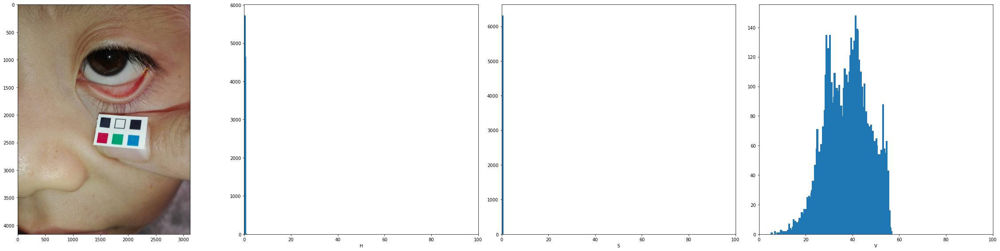

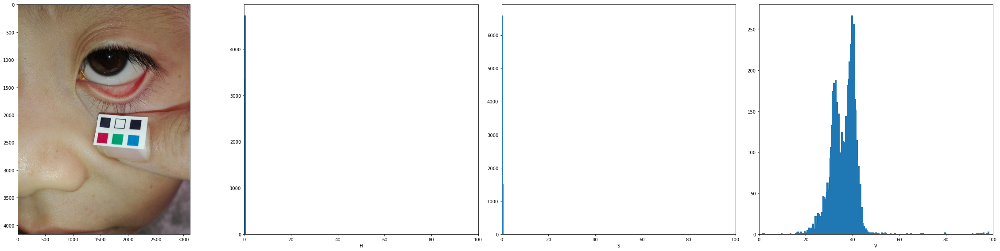

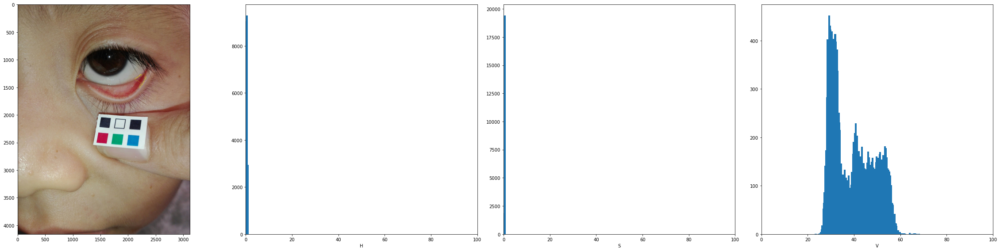

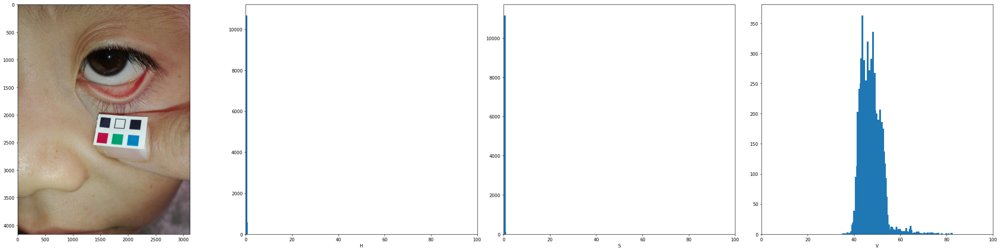

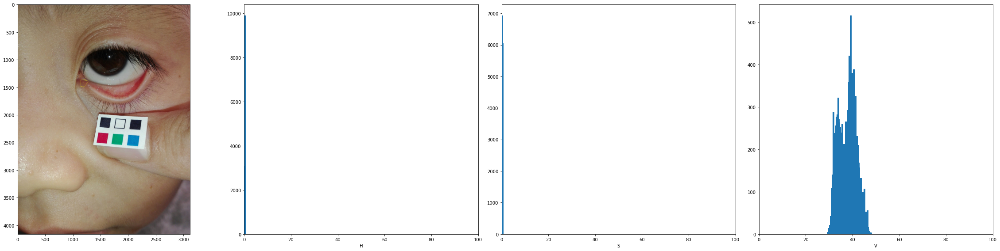

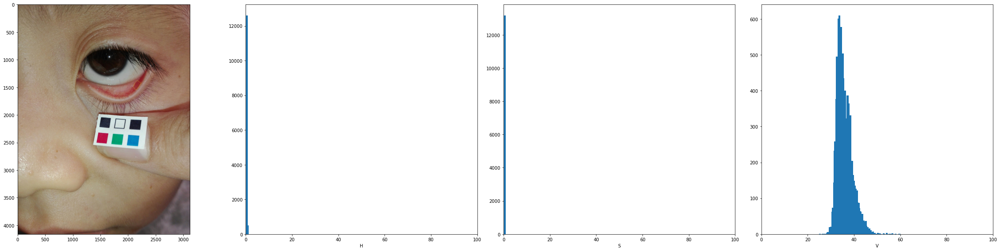

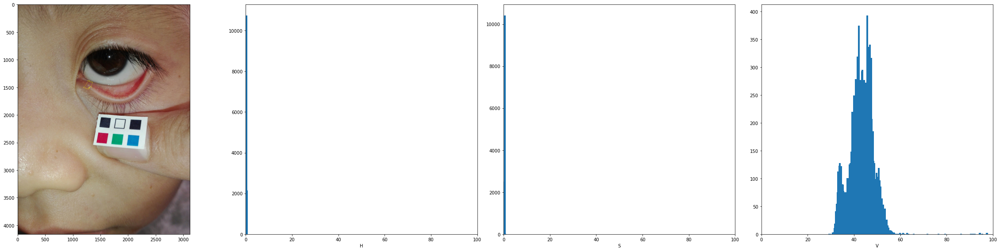

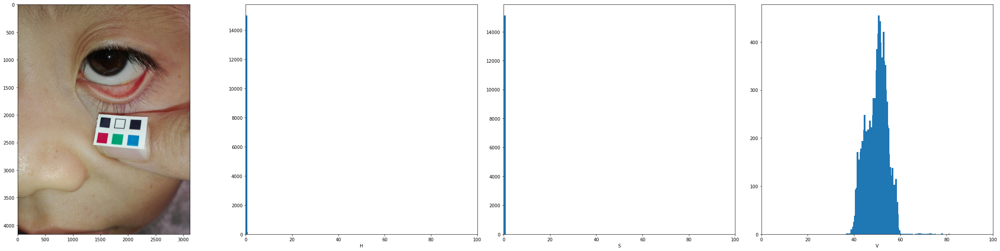

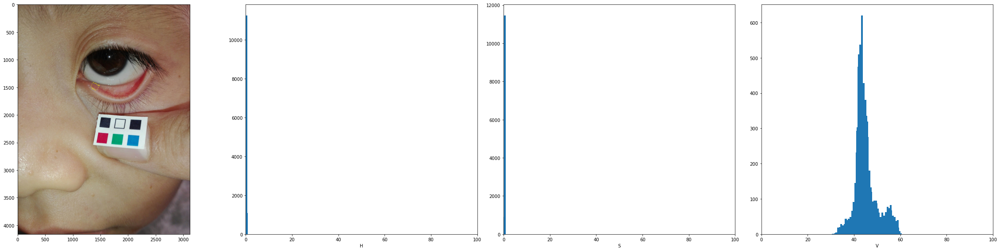

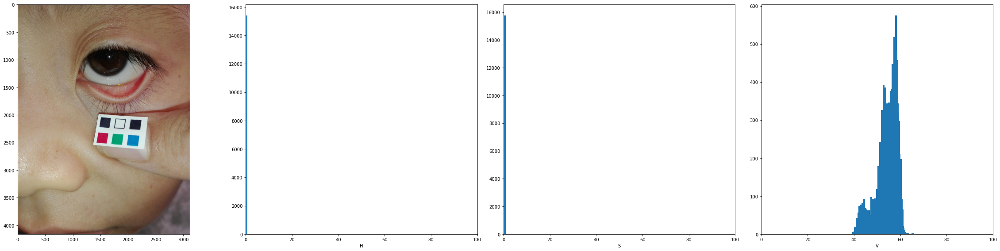

In [44]:
for i in range(1,11):
    indx=np.where(f[:,:,9]==i)
    hists=v_get_Hist_by_format(f,indx[0],indx[1],np.arange(1,10))
    fig, (axi,ax0,ax1,ax2) = plt.subplots(ncols=4, figsize=(32, 8))
    axi.imshow(mark_boundaries(img, m_slic==i, mode='inner',background_label=10))
    #axi.imshow(m_slic==i)
    ax0.bar(x=hists[1][0,:-1],height=hists[0][3])
    ax0.set_xlabel("H")
    ax0.set_xlim([0,100])
    ax1.bar(x=hists[1][0,:-1],height=hists[0][4])
    ax1.set_xlabel("S")
    ax1.set_xlim([0,100])
    ax2.bar(x=hists[1][0,:-1],height=hists[0][5])
    ax2.set_xlabel("V")
    ax2.set_xlim([0,100])
    #ax2.bar(x=hists[1][2,1,1:],height=hists[0][0,2])
    #ax3.imshow(ROI)
    plt.tight_layout()
    plt.show()

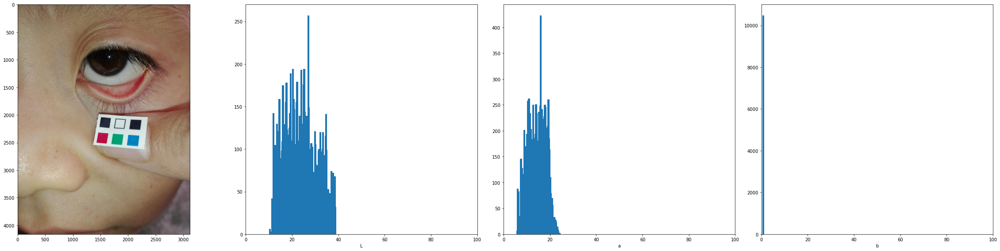

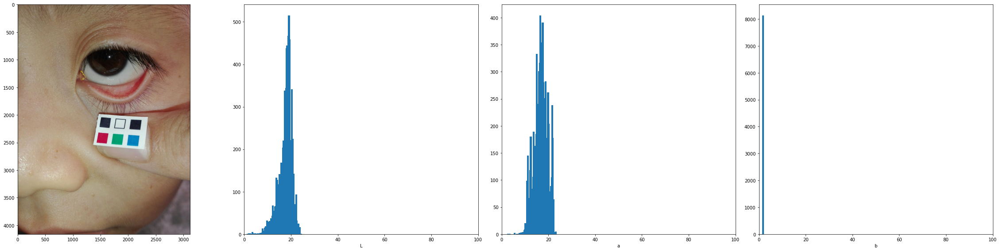

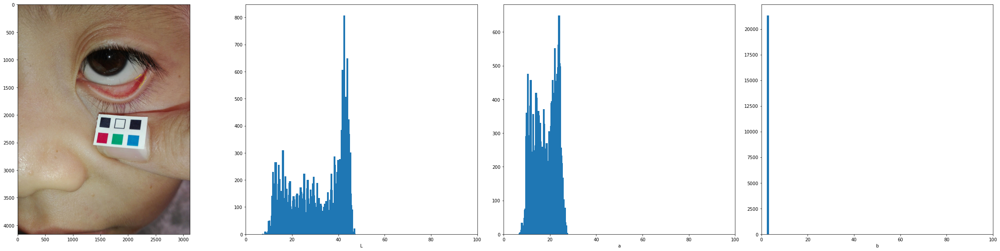

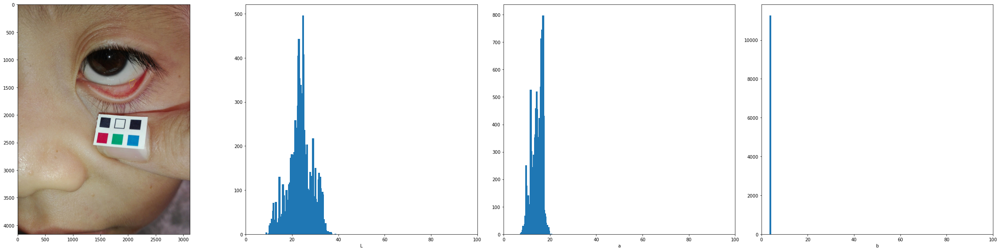

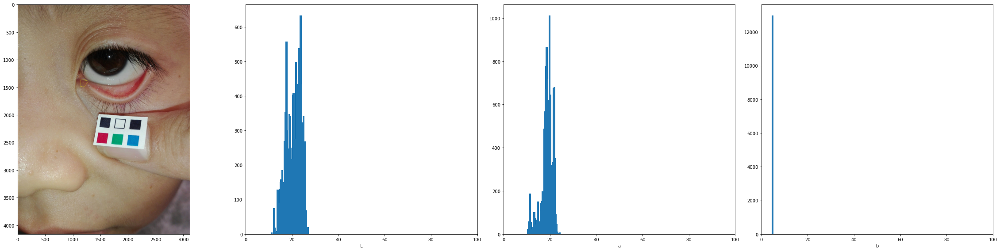

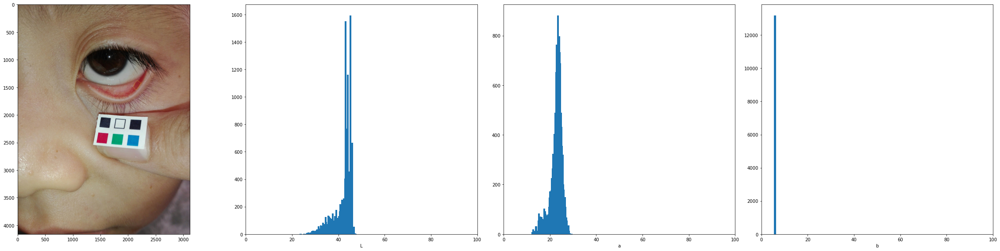

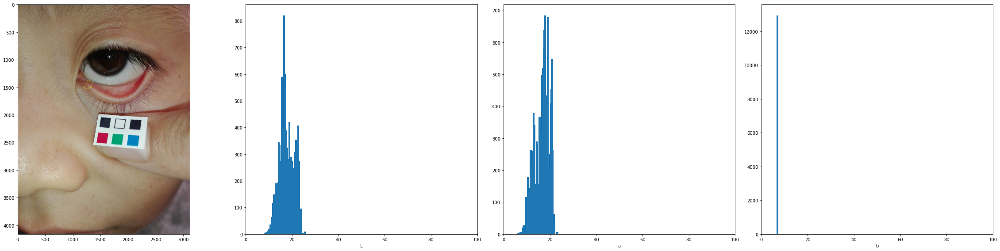

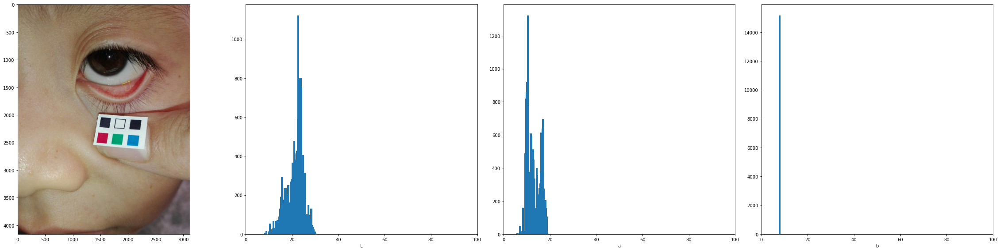

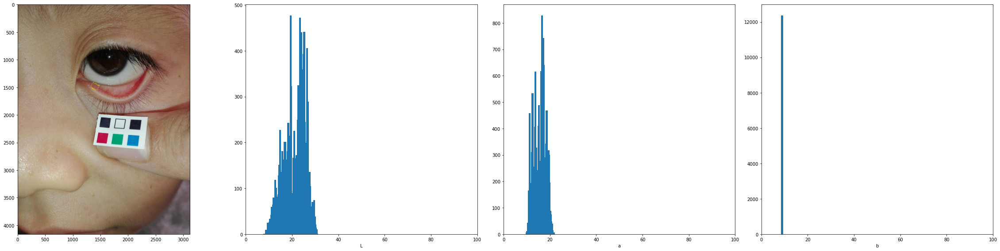

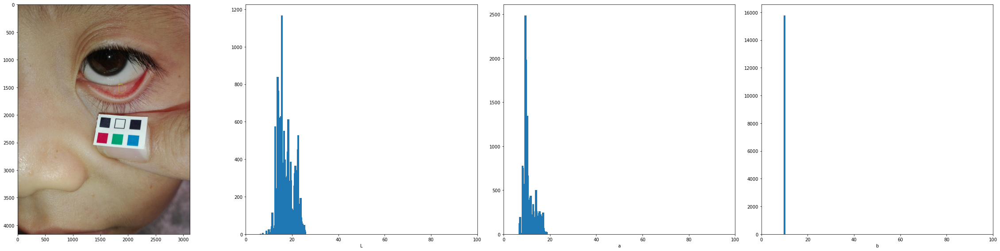

In [45]:
for i in range(1,11):
    indx=np.where(f[:,:,9]==i)
    hists=v_get_Hist_by_format(f,indx[0],indx[1],np.arange(1,10))
    fig, (axi,ax0,ax1,ax2) = plt.subplots(ncols=4, figsize=(32, 8))
    axi.imshow(mark_boundaries(img, m_slic==i, mode='inner',background_label=10))
    #axi.imshow(m_slic==i)
    ax0.bar(x=hists[1][0,:-1],height=hists[0][6])
    ax0.set_xlabel("L")
    ax0.set_xlim([0,100])
    ax1.bar(x=hists[1][0,:-1],height=hists[0][7])
    ax1.set_xlabel("a")
    ax1.set_xlim([0,100])
    ax2.bar(x=hists[1][0,:-1],height=hists[0][8])
    ax2.set_xlabel("b")
    ax2.set_xlim([0,100])
    #ax2.bar(x=hists[1][2,1,1:],height=hists[0][0,2])
    #ax3.imshow(ROI)
    plt.tight_layout()
    plt.show()

In [49]:
np.array(m_slic)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)